# Машинное обучение, ФКН ВШЭ

## Практическое задание 2. Exploratory Data Analysis и линейная регрессия

### Общая информация
Дата выдачи: 21.09.2020

Мягкий дедлайн: 02:59MSK 05.10.2020

Жесткий дедлайн: 23:59MSK 08.10.2020

### О задании
В этом задании мы попытаемся научиться анализировать данные и выделять из них полезные признаки. Мы также научимся пользоваться `seaborn` и `sklearn`, а заодно привыкнем к основным понятиям машинного обучения.

### Оценивание и штрафы
Каждая из задач имеет определенную «стоимость» (указана в скобках около задачи). Максимально допустимая оценка за работу — 10 баллов. Проверяющий имеет право снизить оценку за неэффективную реализацию или неопрятные графики.

**Обратите внимание**, что в каждом разделе домашнего задания есть оцениваниемые задачи и есть вопросы. Вопросы дополняют задачи и направлены на то, чтобы проинтерпретировать или обосновать происходящее. Код без интерпретации не имеет смысла, поэтому отвечать на вопросы обязательно — за отсутствие ответов мы будем снижать баллы за задачи. Если вы ответите на вопросы, но не напишете корректный код к соответствующим оцениваемым задачам, то баллы за такое выставлены не будут.

Сдавать задание после указанного срока сдачи нельзя. При выставлении неполного балла за задание в связи с наличием ошибок на усмотрение проверяющего предусмотрена возможность исправить работу на указанных в ответном письме условиях.

Задание выполняется самостоятельно. «Похожие» решения считаются плагиатом и все задействованные студенты (в том числе те, у кого списали) не могут получить за него больше 0 баллов (подробнее о плагиате см. на странице курса). Если вы нашли решение какого-то из заданий (или его часть) в открытом источнике, необходимо указать ссылку на этот источник в отдельном блоке в конце вашей работы (скорее всего вы будете не единственным, кто это нашел, поэтому чтобы исключить подозрение в плагиате, необходима ссылка на источник).

### Формат сдачи
Задания сдаются через систему Anytask. Инвайт можно найти на странице курса. Присылать необходимо ноутбук с выполненным заданием. Сам ноутбук называйте в формате homework-practice-02-linregr-Username.ipynb, где Username — ваша фамилия.

Для удобства проверки самостоятельно посчитайте свою максимальную оценку (исходя из набора решенных задач) и укажите ниже.

Оценка: xx.

В этом ноутбуке используется библиотека `folium` для визуализации карт. Она работает в google colab!

In [ ]:
!pip install folium

In [1]:
import folium

m = folium.Map(location=(55.7522200, 37.6155600), zoom_start=10)

m

Если вы всё сделали правильно, то выше должна открыться карта Москвы.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

%matplotlib inline

sns.set(style="darkgrid")

## Часть 0. Подготовка (1 балл)

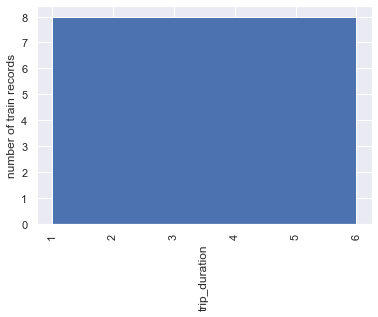

In [7]:
y = [1, 2, 3, 4, 5, 6, 5, 5 ]

plt.hist(y, bins=1)
plt.xlabel('trip_duration', rotation=90)
plt.ylabel('number of train records')
plt.xticks(rotation=90)
plt.show()



**Задание 1 (1 балл)**. Мы будем работать с данными из соревнования [New York City Taxi Trip Duration](https://www.kaggle.com/c/nyc-taxi-trip-duration/overview), в котором нужно было предсказать длительность поездки на такси. Скачайте обучающую выборку из этого соревнования и загрузите ее:

In [83]:
!wget  -O 'train.csv' -q 'https://www.dropbox.com/s/en5f9nhn915cnkf/_train.csv?dl=0'
data = pd.read_csv('train.csv')

Обратите внимание на колонки `pickup_datetime` и `dropoff_datetime`. `dropoff_datetime` был добавлена организаторами только в обучающую выборку, то есть использовать эту колонку нельзя, давайте удалим ее. В `pickup_datetime` записаны дата и время начала поездки. Чтобы с ней было удобно работать, давайте преобразуем даты в `datetime`-объекты

In [84]:
data.head()
data = data.drop(['dropoff_datetime'], axis = 1)
data.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435


In [85]:
data['pickup_datetime'] = pd.to_datetime(data.pickup_datetime)
data.loc[:, 'pickup_date'] = data['pickup_datetime'].dt.date
data.dtypes

id                            object
vendor_id                      int64
pickup_datetime       datetime64[ns]
passenger_count                int64
pickup_longitude             float64
pickup_latitude              float64
dropoff_longitude            float64
dropoff_latitude             float64
store_and_fwd_flag            object
trip_duration                  int64
pickup_date                   object
dtype: object

В колонке `trip_duration` записано целевое значение, которое мы хотим предсказывать. Разбейте выборку на обучающую и тестовую в отношении 7:3.

In [86]:
import math
from sklearn.model_selection import train_test_split


y = data["trip_duration"]
X = data.drop(columns=["trip_duration"])

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=10)


Давайте посмотрим на распределение таргета в обучающей выборке. Для этого нарисуйте его гистограмму:

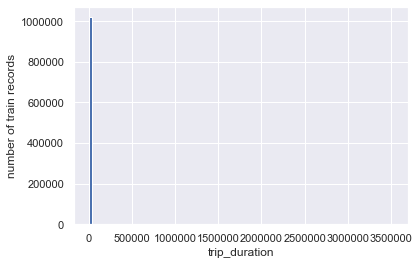

In [87]:
plt.hist(y_train.values, bins=100)
plt.xlabel('trip_duration')
plt.ylabel('number of train records')
plt.show()


Так как есть большие выбросы, то распределение не информативно

**Вопрос**: Что можно сказать о целевой переменной по гистограмме её значений?

В соревновании в качестве метрики качества использовалось RMSLE:
$$\text{RMSLE}(X, y, a) = \sqrt{\frac{1}{\ell}\sum_{i=1}^{\ell} \big(\log{(y_i + 1)} - \log{(a(x_i) + 1)}\big)^2}$$

**Вопрос**: Как вы думаете, почему авторы соревнования выбрали именно RMSLE, а не RMSE?

RMSLE более надежен к выбросам, ибо если посчитать значение ошибки при RMSE если есть выбросы она окажется в разы больше, чем RMSLE.

На семинаре мы рассматривали несколько моделей линейной регрессии в `sklearn`, но каждая из них оптимизировала среднеквадратичную ошибку (MSE), а не RMSLE. Давайте проделаем следующий трюк: будем предсказывать не целевую переменную, а ее *логарифм*. Обозначим $\hat{y}_i = \log{(y_i + 1)}$ — модифицированный таргет, а $\hat{a}(x_i)$ — предсказание модели, которая обучалась на $\hat{y}_i$, то есть логарифм таргета. Чтобы предсказать исходное значение, мы можем просто взять экспоненту от нашего предсказания: $a(x_i) = \exp(\hat{a}(x_i)) - 1$.

**Вопрос**: Покажите, что оптимизация RMSLE для модели $a$ эквивалентна оптимизации MSE для модели $\hat{a}$.

**Доказательство**: ╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Итак, мы смогли свести задачу оптимизации RMSLE к задаче оптимизации MSE, которую мы умеем решать! Кроме того, у логарифмирования таргета есть еще одно полезное свойство. Чтобы его увидеть, добавьте к нашим выборкам колонки `log_trip_duration` (воспользуйтесь `np.log1p`) и нарисуйте гистограмму модифицированного таргета по обучающей выборке:

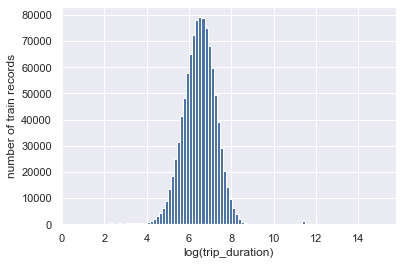

In [88]:
data['log_trip_duration'] = np.log1p(data['trip_duration'].values)
X_train, X_test, y_log_train, y_log_test = train_test_split(X, data['log_trip_duration'], test_size=0.3, random_state=10)

plt.hist(y_log_train.values, bins=100)
plt.xlabel('log(trip_duration)')
plt.ylabel('number of train records')
plt.show()

Чтобы иметь некоторую точку отсчета, давайте посчитаем значение метрики при наилучшем константном предсказании:

In [89]:
el = y_log_train.values - y_log_train.values.sum()/len(y_log_train)
math.sqrt(np.dot(el, el)/len(y_log_train))

0.7963886472231682

## Часть 1. Изучаем `pickup_datetime` (2 балла)

**Задание 2 (0.25 баллов)**. Для начала давайте посмотрим, сколько всего было поездок в каждый из дней. Постройте график зависимости количества поездок от дня в году (например, можно воспользоваться `sns.countplot`):

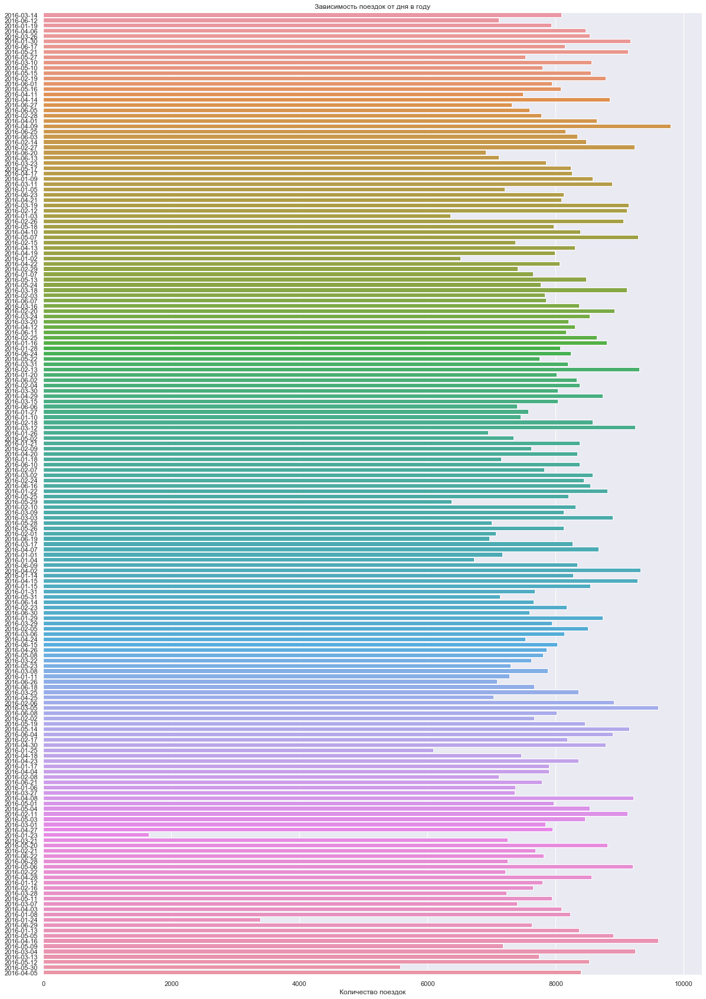

In [90]:
sns.set()
fig, ax = plt.subplots()
ax = sns.countplot(y=data['pickup_date'], data=data)
ax.set_title('Зависимость поездок от дня в году')
ax.set_ylabel('')

ax.set(xlabel='Количество поездок')
ax.figure.set_size_inches(20, 30)

In [91]:
import datetime
data[data.pickup_date ==  datetime.date(2016, 1, 23)].head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,log_trip_duration
310,id1027675,2,2016-01-23 08:46:42,1,-73.969536,40.755219,-73.976524,40.747948,N,1197,2016-01-23,7.088409
593,id2657420,1,2016-01-23 00:06:25,1,-73.982101,40.745903,-73.993843,40.683250,N,1290,2016-01-23,7.163172
794,id3382236,2,2016-01-23 10:38:43,5,-73.975281,40.760990,-73.963181,40.767761,N,332,2016-01-23,5.808142
1162,id2636301,2,2016-01-23 01:16:58,1,-74.004913,40.728310,-73.991524,40.759865,N,977,2016-01-23,6.885510
3486,id0252677,2,2016-01-23 00:19:01,5,-73.993103,40.692940,-73.964149,40.672230,N,981,2016-01-23,6.889591


Это даты 2016-01-23 и 2016-01-24 - В эти даты была снежная буря
http://russian.news.cn/2016-01/23/c_135037964.htm

**Вопрос**: Вы, вероятно, заметили, что на графике есть 2 периода с аномально маленькими количествами поездок. Вычислите, в какие даты происходили эти скачки вниз и найдите информацию о том, что происходило в эти дни в Нью-Йорке.

Нарисуйте графики зависимости количества поездок от дня недели и от часов в сутках (воспользуйтесь `sns.relplot`):

In [92]:
data['pickup_day'] = data['pickup_datetime'].dt.day_name()

In [93]:
ans = data.groupby('pickup_day').count()['id'].reset_index(level = [0])
ans

,pickup_day,id
0,Friday,223533
1,Monday,187418
2,Saturday,220868
3,Sunday,195366
4,Thursday,218574
5,Tuesday,202749
6,Wednesday,210136


//anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


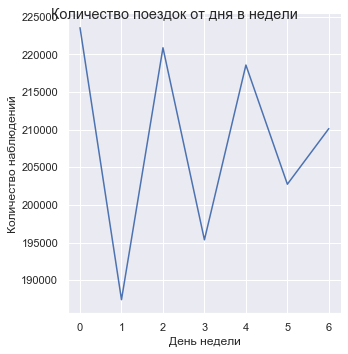

In [94]:
ans = data.groupby('pickup_day').count()['id'].reset_index(level = [0])
#sns.relplot(data = df, x = data.pickup_day.unique(), y = ans.array)
pick = sns.relplot(data = ans, x = ans.index, y = ans['id'].values, kind = 'line')
pick.fig.suptitle('Количество поездок от дня в недели')
pick.set_axis_labels('День недели', 'Количество наблюдений')

//anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


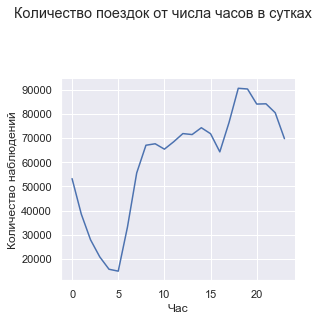

In [95]:
data['hour'] = data['pickup_datetime'].dt.hour
data['month'] = data['pickup_datetime'].dt.month_name()
data['day_year'] = data['pickup_datetime'].dt.dayofyear
data['day'] = data['pickup_datetime'].dt.dayofweek

hours = data.groupby('hour').count()['id']
ax = sns.relplot(data = data, x = hours.index, y = hours.values, kind = 'line', legend = 'full')
ax.fig.suptitle('Количество поездок от числа часов в сутках')
ax.set_axis_labels('Час', 'Количество наблюдений')

**Задание 3 (0.5 баллов)**. Нарисуйте на одном графике зависимости количества поездок от часа в сутках для разных месяцев (разные кривые, соответствующие разным месяцам, окрашивайте в разные цвета, воспользуйтесь `hue` в `sns.relplot`). Аналогично нарисуйте зависимости количества поездок от часа в сутках для разных дней недели.

//anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


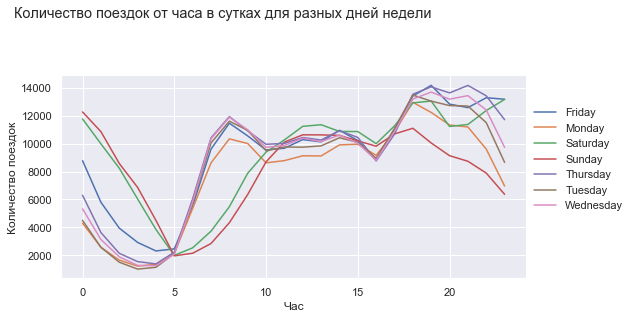

In [96]:
ans = data.groupby(['pickup_day','hour']).count()['id'].reset_index(level = [0]) #from multiindex to single index pandas
ax = sns.relplot(data = ans, x = ans.index, y = ans['id'].values, kind = 'line', legend = 'full', hue = ans['pickup_day'].values, height=5, aspect=2)
ax.fig.suptitle('Количество поездок от часа в сутках для разных дней недели')
ax.set_axis_labels('Час', 'Количество поездок')

Самый пика поездок наблюдается в 17 часов дня для каждого из дней. Связано это с тем, что пассажиры в большинстве своем едут с работы домой. Меньше всего поездок наблюдается с 2 до 5 утра.  
Также меньше всего поездок наблюдается в воскресенье. Это нерабочий день. Но в тоже время, с 0 до 5 утра в вскр больше всего было совершено количество поездок. Могу предположить, что люди собираются у знакомых и тем самым позже в этот день разъезжаются.

//anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


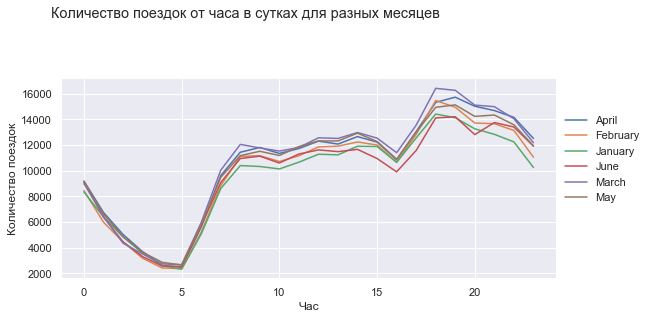

In [97]:
ans1 = data.groupby(['month','hour']).count()['id'].reset_index(level = [0]) #from multiindex to single index pandas
ax = sns.relplot(data = ans1, x = ans1.index, y = ans1['id'].values, kind = 'line', legend = 'full', hue = ans1['month'].values, height=5, aspect=2)
ax.fig.suptitle('Количество поездок от часа в сутках для разных месяцев')
ax.set_axis_labels('Час', 'Количество поездок')

В июне меньше всего поездок. Скорее всего это связано с отпусками. 

**Вопрос**: Какие выводы можно сделать, основываясь на графиках выше? Выделяются ли какие-нибудь дни недели? Месяца? Время суток? С чем это связано?

**Задание 4 (0.5 баллов)**. По *обучающей выборке* нарисуйте график зависимости среднего логарифма времени поездки от дня недели. Затем сделайте то же самое, но для часа в сутках и дня в году.

In [98]:
#Так как обучающая надо смотреть от трэйна

ans = data.groupby(['pickup_day']).count()
#sns.relplot(data = df, x = data.pickup_day.unique(), y = ans.array)
data[data['pickup_day'] == 'Monday']['log_trip_duration'].mean()

6.426563814711166

In [99]:
X_train, X_test, y_log_train, y_log_test = train_test_split(data, data['log_trip_duration'], test_size=0.3, random_state=10)
X_train.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,log_trip_duration,pickup_day,hour,month,day_year,day
824746,id2365163,2,2016-03-27 00:25:29,3,-73.996986,40.742210,-73.987740,40.710659,N,1254,2016-03-27,7.134891,Sunday,0,March,87,6
645821,id3126187,2,2016-03-18 20:44:12,1,-73.989929,40.741760,-73.977280,40.783600,N,970,2016-03-18,6.878326,Friday,20,March,78,4
691846,id2588127,2,2016-04-15 18:26:12,2,-73.972366,40.750725,-73.861832,40.768387,N,2084,2016-04-15,7.642524,Friday,18,April,106,4
1147931,id0915715,2,2016-03-24 14:28:34,1,-73.982361,40.776901,-73.975128,40.760921,N,980,2016-03-24,6.888572,Thursday,14,March,84,3
183569,id3758776,1,2016-04-28 13:53:52,1,-73.973778,40.764374,-73.966957,40.761024,N,481,2016-04-28,6.177944,Thursday,13,April,119,3


//anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


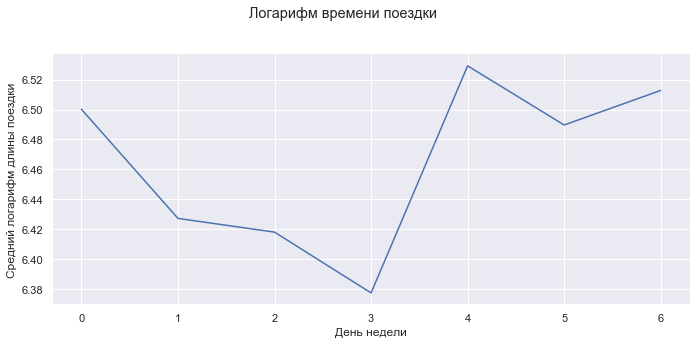

In [100]:
#X_train, X_test, y_log_train, y_log_test = train_test_split(X, data['log_trip_duration'], test_size=0.3, random_state=10)
ans2 = X_train.groupby('pickup_day').mean()['log_trip_duration'].reset_index(level = [0]) #так как обучающая смотрю от X_train
ax = sns.relplot(data = ans2, x = ans2.index, y = ans2['log_trip_duration'].values, kind = 'line', height=5, aspect=2)
ax.fig.suptitle('Логарифм времени поездки')
ax.set_axis_labels('День недели', 'Средний логарифм длины поездки')

//anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


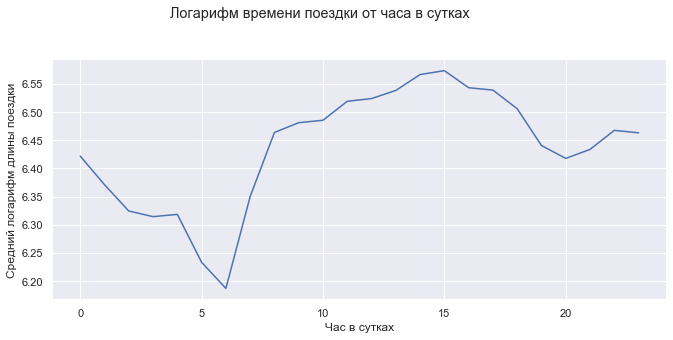

In [101]:
ans3 = X_train.groupby('hour').mean()['log_trip_duration'].reset_index(level = [0]) #так как обучающая смотрю от X_train
ax = sns.relplot(data = ans3, x = ans3.index, y = ans3['log_trip_duration'].values, kind = 'line', height=5, aspect=2)
ax.fig.suptitle('Логарифм времени поездки от часа в сутках')
ax.set_axis_labels('Час в сутках', 'Средний логарифм длины поездки')

//anaconda3/lib/python3.7/site-packages/matplotlib/text.py:1150: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


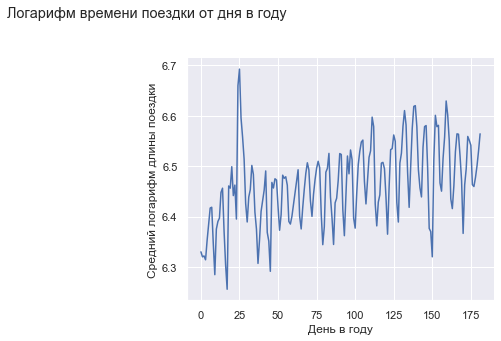

In [24]:
ans4 = X_train.groupby('day_year').mean()['log_trip_duration'].reset_index(level = [0]) #так как обучающая смотрю от X_train
ax = sns.relplot(data = ans3, x = ans4.index, y = ans4['log_trip_duration'].values, kind = 'line', height=5, aspect=2)
ax.fig.suptitle('Логарифм времени поездки от дня в году')
ax.set_axis_labels('День в году', 'Средний логарифм длины поездки')

**Вопрос**: Похожи ли графики зависимости таргета от дня недели и от часа в сутках на аналогичные графики для количества поездок? Почему? Что происходит со средним таргетом в те два аномальных периода, что мы видели выше? Почему так происходит? Наблюдаете ли вы какой-нибудь тренд на графике зависимости `log_trip_duration` от номера дня в году?

Графики не похожи друг на друга. Количество наблюдений и средняя продолжительность поездки не сильно коррелируют между собой. Но в то же время можно сказать, что чем больше наблюдений, тем будет более усреднен логарифм поездки.
Тренд на графики зависимости log_trip_duration похож на линейный. Наблюдается увеличение поездок зима-весна-лето.

Добавьте следующие признаки на основе `pickup_datetime`:
1. День недели
2. Месяц
3. Час
4. Является ли период аномальным (два бинарных признака, соответствующие двум аномальным периодам)
5. Номер дня в году

In [26]:
'''data['hour'] = data['pickup_datetime'].dt.hour
data['month'] = data['pickup_datetime'].dt.month_name()
data['day_year'] = data['pickup_datetime'].dt.dayofyear
data['day'] = data['pickup_datetime'].dt.dayofweek''' #добавил их выше

"data['hour'] = data['pickup_datetime'].dt.hour\ndata['month'] = data['pickup_datetime'].dt.month_name()\ndata['day_year'] = data['pickup_datetime'].dt.dayofyear\ndata['day'] = data['pickup_datetime'].dt.dayofweek"

In [102]:
def change_23(serie):
  if serie['day_year'] == 23:
    return 1
  else:
    return 0

data['anom_23'] = data.apply(change_23, axis=1)

In [103]:
def change_24(serie):
  if serie['day_year'] == 24:
    return 1
  else:
    return 0

data['anom_24'] = data.apply(change_24, axis=1)

In [104]:
df = data

Итак, мы уже создали некоторое количество признаков.

**Вопрос**: Какие из признаков стоит рассматривать как категориальные, а какие - как численные? Почему?

Категориальные в данном случае - день в году и номер месяца, час и день недели. Они не числовые- ибо тогда в регресии числа 1 и 3 имели бы разный вес.

In [105]:
X_train, X_test, y_log_train, y_log_test = train_test_split(data, data['log_trip_duration'], test_size=0.3, random_state=10)

In [106]:
categorical = ['hour', 'day_year', 'month', 'pickup_day']
numeric_features = ['anom_23', 'anom_24']

**Задание 5 (0.75 баллов)**. Обучите `Ridge`-регрессию с параметрами по умолчанию, закодировав все категориальные признаки с помощью `OneHotEncoder`. Численные признаки отмасштабируйте с помощью `StandardScaler`. Используйте только признаки, которые мы выделили в этой части задания.

In [107]:
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error

X_train, X_test, y_log_train, y_log_test = train_test_split(data, data['log_trip_duration'], test_size=0.3, random_state=10)

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_log_train)
y_pred = model.predict(X_test)

print("Test RMSE = %.4f" % math.sqrt(mean_squared_error(y_log_test, y_pred)))


Test RMSE = 0.7865


## Часть 2. Изучаем координаты (3 балла)
Мы уже очень хорошо изучили данные о времени начала поездки, давайте теперь посмотрим на информацию о координатах начала и конца поездки. Мы подготовили для вас функцию, которая на карте рисует точки начала или конца поездки. Примеры ее вызова вы найдете ниже. Обратите внимание, что в эту функцию мы передаем лишь небольшой кусочек данных, посколько иначе функция будет работать очень долго

In [108]:
def show_circles_on_map(data, latitude_column, longitude_column, color):
    """
    The function draws map with circles on it.
    The center of the map is the mean of coordinates passed in data.
    
    data: DataFrame that contains columns latitude_column and longitude_column
    latitude_column: string, the name of column for latitude coordinates
    longitude_column: string, the name of column for longitude coordinates
    color: string, the color of circles to be drawn
    """

    location = (data[latitude_column].mean(), data[longitude_column].mean())
    m = folium.Map(location=location)

    for _, row in data.iterrows():
        folium.Circle(
            radius=100,
            location=(row[latitude_column], row[longitude_column]),
            color=color,
            fill_color=color,
            fill=True
        ).add_to(m)

    return m

In [109]:
show_circles_on_map(df.sample(1000), "pickup_latitude", "pickup_longitude", "blue")

In [110]:
show_circles_on_map(df.sample(5000), "dropoff_latitude", "dropoff_longitude", "blue")

**Вопрос**: Какие две точки выделяются на карте?

Аэропорт John Kennedy, аэропорт La-Guardia

**Задание 6 (0.75 балл)**. Как мы все прекрасно помним, $t = s / v_{\text{ср}}$, поэтому очевидно, что самым сильным признаком будет расстояние, которое необходимо проехать. Мы не можем посчитать точное расстояние, которое необходимо преодолеть такси, но мы можем его оценить, посчитав кратчайшее расстояние между точками начала и конца поездки. Чтобы корректно посчитать расстояние между двумя точками на Земле, можно использовать функцию `haversine`. Также можно воспользоваться кодом с первого семинара. Посчитайте кратчайшее расстояние для объектов и запишите его в колонку `haversine`:

In [111]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:
def haversine_array(lat1, lng1, lat2, lng2):
    lat1, lng1, lat2, lng2 = map(np.radians, (lat1, lng1, lat2, lng2))
    AVG_EARTH_RADIUS = 6371  # in km
    lat = lat2 - lat1
    lng = lng2 - lng1
    d = np.sin(lat * 0.5) ** 2 + np.cos(lat1) * np.cos(lat2) * np.sin(lng * 0.5) ** 2
    h = 2 * AVG_EARTH_RADIUS * np.arcsin(np.sqrt(d))
    return h

data.loc[:, 'distance_haversine'] = haversine_array(data['pickup_latitude'].values, data['pickup_longitude'].values, data['dropoff_latitude'].values, data['dropoff_longitude'].values)
data.head(5)

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,pickup_date,log_trip_duration,pickup_day,hour,month,day_year,day,anom_23,anom_24,distance_haversine
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455,2016-03-14,6.122493,Monday,17,March,74,0,0,0,1.498521
1,id2377394,1,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663,2016-06-12,6.498282,Sunday,0,June,164,6,0,0,1.805507
2,id3858529,2,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,2016-01-19,7.661527,Tuesday,11,January,19,1,0,0,6.385098
3,id3504673,2,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429,2016-04-06,6.063785,Wednesday,19,April,97,2,0,0,1.485498
4,id2181028,2,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435,2016-03-26,6.077642,Saturday,13,March,86,5,0,0,1.188588


Так как мы предсказываем логарифм времени поездки и хотим, чтобы наши признаки были линейно зависимы с этой целевой переменной, нам нужно логарифмировать расстояние: $\log t = \log s - \log{v_{\text{ср}}}$. Запишите логарифм `haversine` в отдельную колонку:

In [112]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data['log_haversine'] = np.log1p(data['distance_haversine'].values)

Убедимся, что логарифм расстояния лучше коррелирует с нашим таргетом, чем просто расстояние:

In [113]:
np.corrcoef(data['log_haversine'], data['log_trip_duration'])

array([[1.        , 0.74988224],
       [0.74988224, 1.        ]])

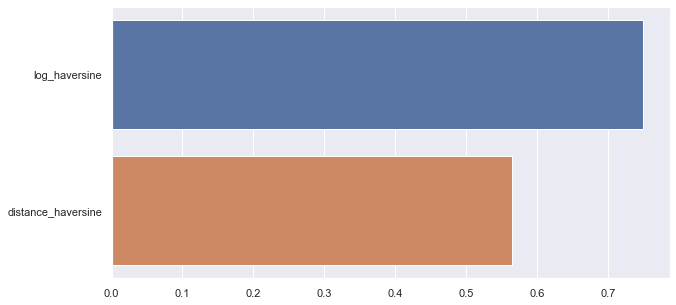

In [114]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
X_train, X_test, y_log_train, y_log_test = train_test_split(data, data['log_trip_duration'], test_size=0.3, random_state=10)

num_features = ['distance_haversine', 'log_haversine']
correlations = X_train[num_features].corrwith(y_log_train).sort_values(ascending=False)


plot = sns.barplot(y=correlations.index, x=correlations)
plot.figure.set_size_inches(10, 5)

Как видно log_haversine с таргетом имеет коэффициент корреляции выше чем distance_haversine с таргетом

**Задание 7 (0.75 балла)**. Давайте изучим среднюю скорость движения такси. Посчитайте среднюю скорость для каждого объекта обучающей выборки, разделив `haversine` на `trip_duration`, и нарисуйте гистограмму ее распределения

Text(0.5, 0, 'Средняя скорость в км/ч')

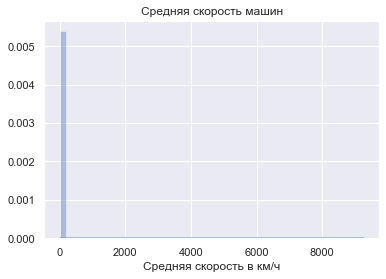

In [115]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
#haversine меряется в километрах
# trip_duration меряется в секундах => надо домножить на 3600, чтобы получить км/ч
data['speed'] = data['distance_haversine']*3600/data['trip_duration']
ax = sns.distplot(data['speed'])
ax.set_title('Средняя скорость машин')
ax.set_xlabel('Средняя скорость в км/ч')

Так как один столбец в гистограмме можно сделать вывод, что есть выбросы. Также на оси скорости отмечены большие значения скоростей

Как можно видеть по гистограмме, для некоторых объектов у нас получились очень больше значения скоростей. Нарисуйте гистограмму по объектам, для которых значение скорости получилось разумным (например, можно не включать рассмотрение объекты, где скорость больше некоторой квантили):

Text(0.5, 0, 'Средняя скорость в км/ч')

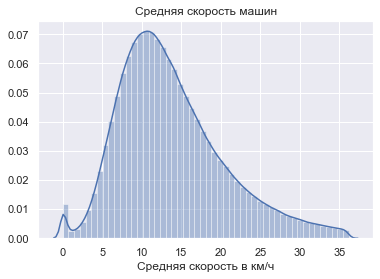

In [116]:
ax = sns.distplot(data[data['speed'] <= data['speed'].quantile(0.98)]['speed'])
ax.set_title('Средняя скорость машин')
ax.set_xlabel('Средняя скорость в км/ч')

Для каждой пары (день недели, час суток) посчитайте медиану скоростей. Нарисуйте с помощью `sns.heatmap` график, где по осям будут дни недели и часы, а в качестве значения функции - медиана скорости

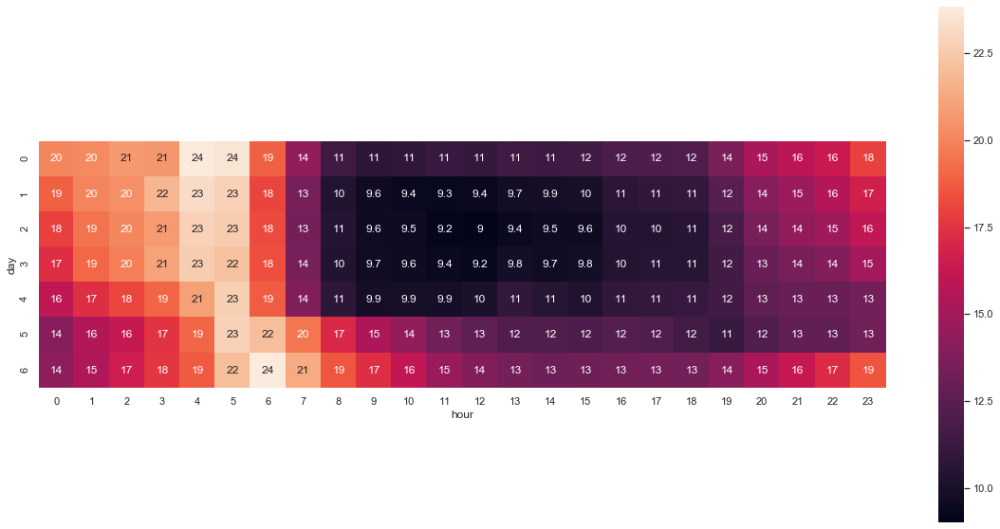

In [117]:
med_speed = data.groupby(['hour', 'day']).median()['speed'].reset_index(level = [1]).reset_index(level = [0])
med_speed = med_speed.pivot(index = 'day', columns = 'hour', values = 'speed')
plt.figure(figsize=(20, 10))
sns.heatmap(med_speed, square=True, annot = True)
plt.show()

Не забудьте удалить колонку со значением скорости из данных!

**Вопрос**: Почему значение скорости нельзя использовать во время обучения?

In [118]:
data = data.drop(columns=['speed'])
data.head(1)

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,log_trip_duration,pickup_day,hour,month,day_year,day,anom_23,anom_24,distance_haversine,log_haversine
0,id2875421,2,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.96463,40.765602,N,455,...,6.122493,Monday,17,March,74,0,0,0,1.498521,0.915699


Ибо изначально v = S/t, это искуственно созданный признак. По факту лик - если кому-то дать такие данные, то он на них найдет правильную закономерность и восстановит таргет.

Изначально делали скорость для того, чтобы позаниматься инженерингом фичей и придумать признаки, к примеру, поездка совершается в период пробок/свободных дорог.


**Вопрос**: Посмотрите внимательно на график и скажите, в какие моменты времени скорость минимальна; максимальна.

Создайте признаки "поездка совершается в период пробок" и "поездка совершается в период свободных дорог" (естественно, они не должен зависеть от скорости!):

По графику видно, что в будние дни с 8-18 медианное значение скорости низкое. Это говорит о том, что поездка совершается в период пробок. По будням же, с 0 до 5 часов дороги свободны.(Или же с 3-5 утра очень свободно)
Признак поездка совершается в период пробок буду считать - если значение медианы для этого периода <= 16
Другой признак >16 - свободные дороги.

In [119]:
df = data

In [120]:
# 5 число с 9 по 01 00 6 ого с 11 по 20 00 и 00 01
# остальные дни там где меньше 16 - то есть это будни с 7 до 22 00 включительно

data['jam'] = (((data['hour'] >= 7) & (data['hour'] <= 22) & (data['day'] >= 0) & (data['day'] <= 4)) | ((data['day'] == 5) & (data['hour'] >= 9) & (data['hour'] <= 23)) | ((data['day'] == 6) & (data['hour'] >= 12) & (data['hour'] <= 19)) | ((data['day'] == 6) & ((data['hour'] == 0)|(data['hour'] == 1))) | ((data['day'] == 5) & (data['hour'] == 0)))*1

In [121]:
data['no_jam'] = (~(((data['hour'] >= 7) & (data['hour'] <= 22) & (data['day'] >= 0) & (data['day'] <= 4)) | ((data['day'] == 5) & (data['hour'] >= 9) & (data['hour'] <= 23)) | ((data['day'] == 6) & (data['hour'] >= 12) & (data['hour'] <= 19)) | ((data['day'] == 6) & ((data['hour'] == 0)|(data['hour'] == 1))) | ((data['day'] == 5) & (data['hour'] == 0))))*1


**Задание 8 (0.25 балла)**. Как уже было замечено выше, на карте выделяются две точки вдали от Манхэттена. Для каждой из них добавьте в выборку два признака: началась ли поездка в ней и закончилась ли она в ней.

In [ ]:
# эти две точки - два аэропорта. Первую точку подберу этого места - остальные оформлю в небольшую окрестность

In [122]:
# ax = sns.distplot(data[data['speed'] <= data['speed'].quantile(0.98)]['speed'])
data_check = data[data['distance_haversine'] >= data['distance_haversine'].quantile(0.98)]


In [123]:
data.head(50)[33:34]

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,hour,month,day_year,day,anom_23,anom_24,distance_haversine,log_haversine,jam,no_jam
33,id0023813,1,2016-04-17 14:38:30,1,-73.990311,40.75658,-73.870918,40.77393,N,2269,...,14,April,108,6,0,0,10.238385,2.419335,1,0


In [124]:
show_circles_on_map(data.head(50)[33:34], "dropoff_latitude", "dropoff_longitude", "blue") #эмпирически смотрю первый руками, далее подбираю квадрат для данной области

In [125]:
la_guardia= data[(data["dropoff_latitude"] <= 40.783) & (data["dropoff_latitude"] >= 40.768) & (data["dropoff_longitude"] <= -73.865) & (data["dropoff_longitude"] >= -73.9) ] #хардкожу
la_guardia.shape

(12810, 23)

In [126]:
show_circles_on_map(la_guardia, "dropoff_latitude", "dropoff_longitude", "blue")

In [127]:
kennedy = data[(data["pickup_latitude"] <= 40.646) & (data["pickup_latitude"] >= 40.635) & (data["pickup_longitude"] <= -73.76) & (data["pickup_longitude"] >= -73.82) ]
kennedy.shape

(21959, 23)

In [128]:
show_circles_on_map(kennedy[0:10000], "pickup_latitude", "pickup_longitude", "blue")

Для каждого из созданных признаков нарисуйте "ящик с усами" (`sns.boxplot`) распределения логарифма времени поездки

In [129]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
# признак kennedy_finish - закончилась ли поездка в аэропрту кеннеди
data['kennedy_finish'] = ((data["dropoff_latitude"] <= 40.646) & (data["dropoff_latitude"] >= 40.635) & (data["dropoff_longitude"] <= -73.76) & (data["dropoff_longitude"] >= -73.82))*1

In [130]:
data['kennedy_start'] = ((data["pickup_latitude"] <= 40.646) & (data["pickup_latitude"] >= 40.635) & (data["pickup_longitude"] <= -73.76) & (data["pickup_longitude"] >= -73.82))*1

In [131]:
data['la_guardia_finish']=((data["dropoff_latitude"] <= 40.783) & (data["dropoff_latitude"] >= 40.768) & (data["dropoff_longitude"] <= -73.865) & (data["dropoff_longitude"] >= -73.9))*1
data['la_guardia_finish'].value_counts()

0    1445834
1      12810
Name: la_guardia_finish, dtype: int64

In [132]:
data['la_guardia_start']=((data["pickup_latitude"] <= 40.783) & (data["pickup_latitude"] >= 40.768) & (data["pickup_longitude"] <= -73.865) & (data["pickup_longitude"] >= -73.9))*1
data['la_guardia_start'].value_counts()

0    1436790
1      21854
Name: la_guardia_start, dtype: int64

**Вопрос**: судя по графикам, как вы думаете, хорошими ли получились эти признаки?

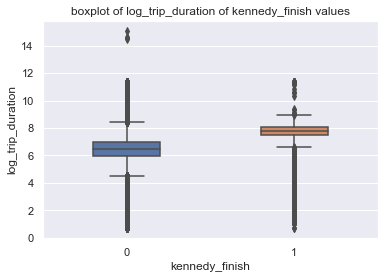

In [133]:
sns.boxplot(x="kennedy_finish", y="log_trip_duration", data=data, width=0.4).set_title("boxplot of log_trip_duration of kennedy_finish values")
plt.show()

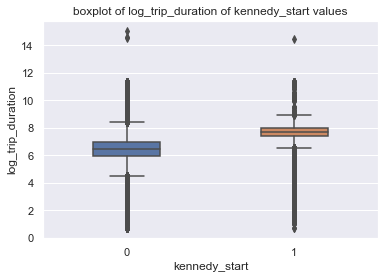

In [134]:
sns.boxplot(x="kennedy_start", y="log_trip_duration", data=data, width=0.4).set_title("boxplot of log_trip_duration of kennedy_start values")
plt.show()

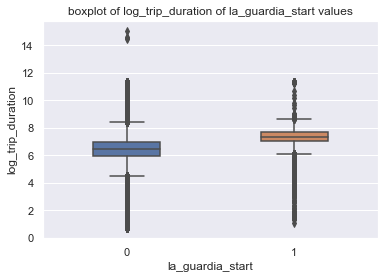

In [135]:
sns.boxplot(x="la_guardia_start", y="log_trip_duration", data=data, width=0.4).set_title("boxplot of log_trip_duration of la_guardia_start values")
plt.show()

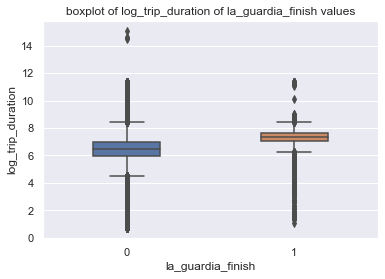

In [136]:
sns.boxplot(x="la_guardia_finish", y="log_trip_duration", data=data, width=0.4).set_title("boxplot of log_trip_duration of la_guardia_finish values")
plt.show()

Признаки получились хорошие. Видно что каждый график имеет разные медианы, и разные квартили. Это говорит, что модель сможет дополнительно настроиться по этим данным и подкорректировать свою точность.

<img src="https://www.dropbox.com/s/xson9nukz5hba7c/map.png?raw=1" align="right" width="20%" style="margin-left: 20px; margin-bottom: 20px">

**Задание 9 (1 балл)**. Сейчас мы почти что не используем сами значения координат. На это есть несколько причин: по отдельности рассматривать широту и долготу не имеет особого смысла, стоит рассматривать их вместе. Во-вторых, понятно, что зависимость между нашим таргетом и координатами не линейная. Чтобы как-то использовать координаты, можно прибегнуть к следующему трюку: обрамим область с наибольшим количеством поездок прямоугольником (как на рисунке). Разобьем этот прямоугольник на ячейки. Каждой точке сопоставим номер ее ячейки, а тем точкам, что не попали ни в одну из ячеек, сопоставим значение -1.

Напишите трансформер, который сначала разбивает показанную на рисунке область на ячейки, а затем создает два признака: номер ячейки, в которой началась поездка, и номер ячейки, в которой закончилась поездка. Количество строк и столбцов выберите самостоятельно.

Обратите внимание, что все вычисления должны быть векторизованными, трансформер не должен модифицировать передаваемую ему выборку inplace, а все необходимые статистики (если они вдруг нужны) нужно считать только по обучающей выборке в методе `fit`:

In [137]:
show_circles_on_map(data.head(200)[185:186],  "dropoff_latitude", "dropoff_longitude", "blue")

In [138]:
data.head(200)[185:186]

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,anom_23,anom_24,distance_haversine,log_haversine,jam,no_jam,kennedy_finish,kennedy_start,la_guardia_finish,la_guardia_start
185,id3198639,1,2016-06-05 03:02:46,1,-73.97979,40.781265,-73.94088,40.823223,N,733,...,0,0,5.700274,1.902148,0,1,0,0,0,0


In [139]:
df = data
df['new_feature_finish'] = -1
cur = 0
for i in range(5):
    for j in range(4):
        df.loc[((df['pickup_longitude'] >= -74.016+0.02*j) & (df['pickup_longitude'] < -74.016+0.02*(j+1)) &(df['pickup_latitude']>= 40.704 + 0.025*i) & (df['pickup_latitude'] <  40.704 + 0.025*(i+1))), 'new_feature_finish']=cur
        cur += 1

df['new_feature_finish'].value_counts()

 5     305400
 9     233126
 10    214953
 4     121756
-1     116017
 0     106022
 1      73407
 14     71066
 11     56717
 15     45799
 6      42634
 13     31653
 8      14088
 19      8135
 18      7266
 2       4179
 3       3270
 7       3141
 12         9
 16         3
 17         3
Name: new_feature_finish, dtype: int64

In [140]:
df['new_feature'] = -1
cur = 0
for i in range(5):
    for j in range(4):
        #df['new_feature'] = ((rectan['dropoff_longitude'] >= -74.016+0.02*j) & (rectan['dropoff_longitude'] < -74.016+0.02*(j+1)) &(rectan['dropoff_latitude']>= 40.704 + 0.025*i) & (rectan['dropoff_latitude'] <  40.704 + 0.025*(i+1)))
        df.loc[((df['dropoff_longitude'] >= -74.016+0.02*j) & (df['dropoff_longitude'] < -74.016+0.02*(j+1)) &(df['dropoff_latitude']>= 40.704 + 0.025*i) & (df['dropoff_latitude'] <  40.704 + 0.025*(i+1))), 'new_feature']=cur
        print(cur)
        cur += 1

df['new_feature'].value_counts()

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


 5     267101
 9     213060
 10    196924
-1     168098
 4     106221
 0     100306
 14     72045
 1      66362
 11     58420
 15     56286
 6      48434
 13     31442
 8      19963
 19     19327
 18     11066
 3       9137
 2       9032
 7       5345
 12        53
 17        18
 16         4
Name: new_feature, dtype: int64

In [141]:
data.head(50)[3:4]

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,distance_haversine,log_haversine,jam,no_jam,kennedy_finish,kennedy_start,la_guardia_finish,la_guardia_start,new_feature_finish,new_feature
3,id3504673,2,2016-04-06 19:32:31,1,-74.01004,40.719971,-74.012268,40.706718,N,429,...,1.485498,0.910473,1,0,0,0,0,0,0,0


In [687]:
#реализация трансформера в виде класса
from sklearn.base import BaseEstimator, TransformerMixin

class MapGridTransformer(BaseEstimator, TransformerMixin):
    
    def __init__(self, this = True):
        self.this = this
        
    def fit(self, X, y = None): 
        return self 
    
    def transform(self, X, y = None): # посчитать номер сектора
        df = X.copy()
        df['new_feature'] = -1
        cur = 0
        for i in range(5):
            for j in range(4):
                df.loc[((df['dropoff_longitude'] >= -74.016+0.02*j) & (df['dropoff_longitude'] < -74.016+0.02*(j+1)) &(df['dropoff_latitude']>= 40.704 + 0.025*i) & (df['dropoff_latitude'] <  40.704 + 0.025*(i+1))), 'new_feature']=cur
                cur += 1
        return df['new_feature']


ts = MapGridTransformer()
ts.fit(df1)
df2 = ts.transform(df1)
df2


In [689]:
ts = MapGridTransformer()


In [691]:
ts.fit(df1)
df2 = ts.transform(df1)
df2

0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19


0          10
1           4
2           0
3           0
4          14
5           5
6          10
7          -1
8           5
9          14
10          4
11         10
12          9
13         10
14         14
15         11
16          0
17          0
18          5
19          1
20         10
21         10
22          5
23          0
24         -1
25          6
26         14
27         -1
28         -1
29         -1
           ..
1458614    10
1458615     2
1458616     4
1458617     6
1458618     4
1458619    13
1458620     4
1458621     5
1458622     0
1458623     1
1458624    10
1458625    10
1458626    11
1458627    10
1458628     2
1458629    -1
1458630     5
1458631    15
1458632     4
1458633     9
1458634    10
1458635     9
1458636    -1
1458637    11
1458638     9
1458639     5
1458640    14
1458641     0
1458642    10
1458643    14
Name: new_feature, Length: 1458644, dtype: int64

**Задание 10 (0.25 балла)**. Обучите `Ridge`-регрессию со стандартными параметрами на признаках, которые мы выделили к текущему моменту. Категориальные признаки закодируйте через one-hot-кодирование, числовые признаки отмасштабируйте.

In [142]:
df.dtypes
df1 = df
#категориальные признаки - номера ячейки старта/финиша

categorical = ['hour', 'day_year', 'month', 'pickup_day', 'new_feature', 'new_feature_finish']
numeric_features = ['anom_23', 'anom_24', 'jam', 'no_jam', 'kennedy_finish', 'kennedy_start','la_guardia_finish', 'la_guardia_start' ]

X_train, X_test, y_log_train, y_log_test = train_test_split(df1, df1['log_trip_duration'], test_size=0.3, random_state=10)

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model = pipeline.fit(X_train, y_log_train)
y_pred = model.predict(X_test)

print("Test RMSE = %.4f" % math.sqrt(mean_squared_error(y_log_test, y_pred)))



Test RMSE = 0.7277


В прошлый раз без добавления данных признаков Test RMSE = 0.7865. То есть произошло некоторое улучшение модели.

## Часть 3. Изучаем оставшиеся признаки (1 балл)

**Задание 11 (0.75 баллов)**. У нас осталось еще 3 признака, которые мы не исследовали: `vendor_id`, `passenger_count` и `store_and_fwd_flag`.

**Вопрос**: Подумайте, почему каждый из этих признаков может быть потенциально полезным.

Посчитайте, сколько есть уникальных значений у каждого из этих признаков:

In [143]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
print("Уникальные значения vendor_id", data['vendor_id'].unique())
print("Уникальные значения passenger_count", data['passenger_count'].unique())
print("Уникальные значения store_and_fwd_flag", data['store_and_fwd_flag'].unique())

Уникальные значения vendor_id [2 1]
Уникальные значения passenger_count [1 6 4 2 3 5 0 7 9 8]
Уникальные значения store_and_fwd_flag ['N' 'Y']


Постройте "ящики с усами" распределений логарифма времени поездки в зависимости от значений каждого из признаков

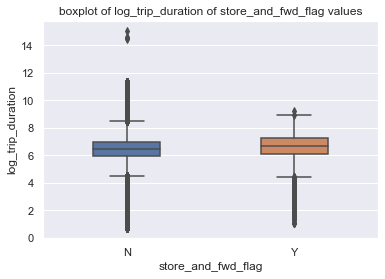

In [144]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
sns.boxplot(x="store_and_fwd_flag", y="log_trip_duration", data=df, order=["N", "Y"], width=0.4).set_title("boxplot of log_trip_duration of store_and_fwd_flag values")
plt.show()

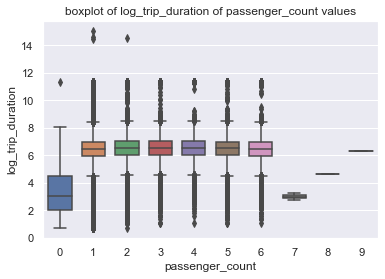

In [145]:
sns.boxplot(x="passenger_count", y="log_trip_duration", data=df, width=0.7).set_title("boxplot of log_trip_duration of passenger_count values")
plt.show()

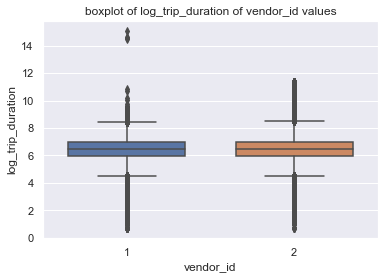

In [146]:
sns.boxplot(x="vendor_id", y="log_trip_duration", data=df, width=0.7).set_title("boxplot of log_trip_duration of vendor_id values")
plt.show()

Переведите признаки `vendor_id` и `store_and_fwd_flag` в значения $\{0;1\}$

In [147]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
data['vendor_id'] = data['vendor_id'] -1
data.head()

,id,vendor_id,pickup_datetime,passenger_count,pickup_longitude,pickup_latitude,dropoff_longitude,dropoff_latitude,store_and_fwd_flag,trip_duration,...,distance_haversine,log_haversine,jam,no_jam,kennedy_finish,kennedy_start,la_guardia_finish,la_guardia_start,new_feature_finish,new_feature
0,id2875421,1,2016-03-14 17:24:55,1,-73.982155,40.767937,-73.964630,40.765602,N,455,...,1.498521,0.915699,1,0,0,0,0,0,9,10
1,id2377394,0,2016-06-12 00:43:35,1,-73.980415,40.738564,-73.999481,40.731152,N,663,...,1.805507,1.031584,1,0,0,0,0,0,5,4
2,id3858529,1,2016-01-19 11:35:24,1,-73.979027,40.763939,-74.005333,40.710087,N,2124,...,6.385098,1.999464,1,0,0,0,0,0,9,0
3,id3504673,1,2016-04-06 19:32:31,1,-74.010040,40.719971,-74.012268,40.706718,N,429,...,1.485498,0.910473,1,0,0,0,0,0,0,0
4,id2181028,1,2016-03-26 13:30:55,1,-73.973053,40.793209,-73.972923,40.782520,N,435,...,1.188588,0.783257,1,0,0,0,0,0,14,14


In [148]:
df['store_and_fwd_flag'] = df['store_and_fwd_flag'].apply(lambda x: 1 if x =='N' else 0)


**Вопрос**: Основываясь на графиках выше, как вы думаете, будут ли эти признаки сильными?

Признак vendor_id имеет практически идентичный boxplot. Данный признак существенно не окажет влияния на обучение.
passenger_id  улучшит немного модель, так как он сильно позволяет понять структуру о 0, 1 и 7+ пассажирах. Для 1 к примеру больше результатов с максимальным значением.  Флаги также внесут некий результат, ибо распределение немного другое - отличатеся медиана, макс/мин значения. Но структура не сильно различная.

Могу сделать вывод, что будет некое улучшение, но маленькое.

**Задание 12 (0.25 баллов)**. Проверьте свои предположения, обучив модель в том числе и на этих трех признаках. Обучайте `Ridge`-регрессию со стандартными параметрами. Категориальные признаки закодируйте one-hot-кодированием, а численные отмасштабируйте.

In [149]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
df2 = data.copy()
categorical = ['hour', 'day_year', 'month', 'pickup_day', 'new_feature', 'new_feature_finish', 'passenger_count']
numeric_features = ['anom_23', 'anom_24', 'jam', 'no_jam', 'kennedy_finish', 'kennedy_start','la_guardia_finish', 'la_guardia_start', 'vendor_id','store_and_fwd_flag' ]

X_train, X_test, y_log_train, y_log_test = train_test_split(df2, df2['log_trip_duration'], test_size=0.3, random_state=10)

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model1 = pipeline.fit(X_train, y_log_train)
y_pred = model1.predict(X_test)

print("Test RMSE = %.4f" % math.sqrt(mean_squared_error(y_log_test, y_pred)))



Test RMSE = 0.7271


In [150]:
print("Test RMSE train = %.4f" % math.sqrt(mean_squared_error(y_log_train, model1.predict(X_train))))

Test RMSE train = 0.7278


In [151]:
data_res= data.copy()

Если признаки не дали какого-то ощутимого улучшения метрики, их можно выбросить из данных.

Как видно улучшение составило 0.006 => можно выкинуть данные признаки из данных.

In [152]:
data = data.drop(['passenger_count', 'vendor_id','store_and_fwd_flag' ], axis = 1)

## Часть 4. Улучшаем модель (3 балла)

**Задание 13 (1 балл)**. В наших данных есть нетипичные объекты: с аномально маленьким времени поездки, с очень большим пройденным расстоянием или очень большими остатками регрессии. В этом задании предлагается исключить такие объекты из обучающей выборки. Для этого нарисуйте гистограммы распределения упомянутых выше величин, выберите объекты, которые можно назвать выбросами, и очистите обучающую выборку от них.

Отметим, что хотя эти объекты и выглядят как выбросы, в тестовой выборке тоже скорее всего будут объекты с такими же странными значениями целевой переменной и/или признаков. Поэтому, возможно, чистка обучающей выборки приведёт к ухудшению качества на тесте. Тем не менее, всё равно лучше удалять выбросы из обучения, чтобы модель получалась более разумной и интерпретируемой.

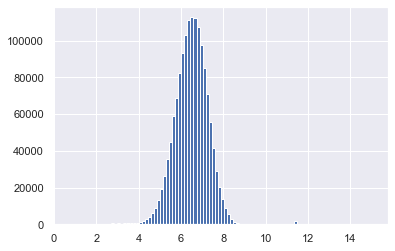

In [153]:
plt.hist(np.log1p(data.trip_duration), bins=100)
plt.show() 

В целом-  распределение очень похоже на нормальное, средняя продолжительность поездки находится в этом интервале:

In [154]:
print("В секундах:", np.exp(5), np.exp(9))
print("В минутах:", np.exp(5) // 60, np.exp(9) // 60)

В секундах: 148.4131591025766 8103.083927575384
В минутах: 2.0 135.0


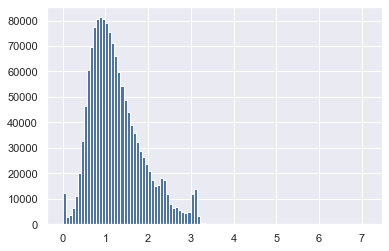

In [155]:
plt.hist(np.log1p(data.distance_haversine), bins=100)
plt.show()

In [156]:
print("В км:", np.exp(0), np.exp(3.2)) # остальное в большую сторону буду считать как выброс

В км: 1.0 24.532530197109352


In [157]:
len(data[data['distance_haversine'] >= 25]) # количество выбросов, которые буду удалять по дистанции

1396

Теперь буду искать большие остатки регресси. Логарифм, который был ранее посчитан для таргета, теперь e(x)-1. Инверсивная функция к логарифму

In [158]:
df2 = data
y_pred_train = model.predict(X_train) #нужно чтобы оценивать среднюю ошибку для выбросов, делать до нового трейна
X_train, X_test, y_log_train, y_log_test = train_test_split(df2, df2['log_trip_duration'], test_size=0.3, random_state=10)


In [159]:
y_pred_train = np.expm1(y_pred_train) # тренируюсь по регресии Ridge - ранее
y_pred_train

array([ 577.72201446,  539.47446838, 1219.25770186, ...,  439.29676202,
        726.77540747,  849.47207018])

In [160]:
error = (y_pred_train - y_log_train)**2

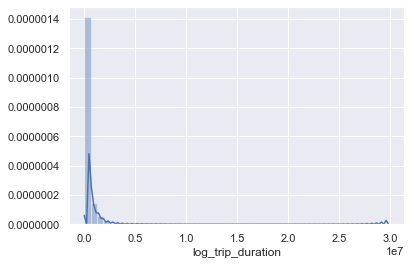

In [161]:
sns.distplot(error)

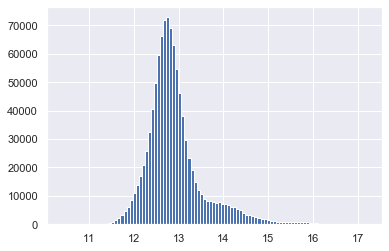

In [162]:
plt.hist(np.log1p(error), bins=100)
plt.show()

Как видно из гистограммы, есть примеры с очень большими остатками. Попробуем их выбросить из обучающей выборки. Например, выбросим примеры, остаток у которых больше 0.98-квантили.

In [163]:
mask = np.quantile(error, 0.98) 
mask

2635929.703277073

In [164]:
(error>np.quantile(error, 0.98)).sum() # удалю 20000 объектов

20421

In [165]:
df2 = data.copy()

In [166]:
X_train1, X_test1, y_train1, y_test1 = train_test_split(data, data['log_trip_duration'], test_size=0.3, random_state=10)
X_train1['residuals'] = error
print(len(X_train1))

X_train1 = X_train1[(X_train1['trip_duration'] > 120) & (X_train1['trip_duration'] < 8500) & (X_train1['distance_haversine'] < 25) & (X_train1['residuals'] <mask)]

print(len(X_train1))

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  


1021050
979417


In [116]:
print(len(X_train1)) # убралось 40000 объектов


979417


Сейчас у нас очень много категориальных признаков. В категориальных признаках могут содержаться редкие категории, обычно это плохо: модель сильно переобучается на таких примерах. Попробуйте объединить редкие категории в одну. Естественно, делать это нужно только для действительно редких категорий.

Сейчас категориальные признаки - categorical = ['hour', 'day_year', 'month', 'pickup_day', 'new_feature', 'new_feature_finish']

In [167]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
print("hour", X_train1['hour'].value_counts().min())
print("day_year", X_train1['day_year'].value_counts().min())
print("month", X_train1['month'].value_counts().min())
print("pickup_day", X_train1['pickup_day'].value_counts().min())
X_train1['new_feature_finish'].value_counts()

hour 9775
day_year 1128
month 154462
pickup_day 125814


 5     208569
 9     158987
 10    146738
 4      83388
 0      72749
-1      63146
 1      50518
 14     48358
 11     38543
 15     30864
 6      28960
 13     21523
 8       9597
 19      5551
 18      4887
 2       2888
 3       2244
 7       1903
 12         2
 16         1
 17         1
Name: new_feature_finish, dtype: int64

In [168]:
var = X_train1['new_feature_finish'].value_counts()
ans = var.loc[var < 100].index

Как видно отсюда самые малочисленные категории относятся к ячейкам, которые угловые для квадрата Нью-Йорка - данные ячейки можно положить -1. 

In [169]:
X_train2 = X_train1.copy()

In [88]:
X_train3 = X_train1.copy()

In [170]:
X_train2['new_feature'] = X_train2['new_feature'].apply(lambda x: -1 if x in ans else x)

X_train2['new_feature'].value_counts()

 5     183003
 9     145236
 10    134999
-1      99066
 4      72470
 0      68613
 14     48872
 1      45529
 11     39633
 15     37865
 6      33310
 13     21419
 8      13590
 19     13050
 18      7539
 3       5940
 2       5912
 7       3371
Name: new_feature, dtype: int64

In [171]:
var1  = X_train1['new_feature_finish'].value_counts()
ans1 = var1.loc[var1 < 100].index

X_train2['new_feature_finish'] = X_train2['new_feature_finish'].apply(lambda x: -1 if x in ans1 else x)

X_train2['new_feature_finish'].value_counts()

 5     208569
 9     158987
 10    146738
 4      83388
 0      72749
-1      63150
 1      50518
 14     48358
 11     38543
 15     30864
 6      28960
 13     21523
 8       9597
 19      5551
 18      4887
 2       2888
 3       2244
 7       1903
Name: new_feature_finish, dtype: int64

In [178]:
y_train1 = X_train2['log_trip_duration']
X_train2 = X_train2.drop(['residuals'], axis = 1)

Обучите модель на очищенных данных и посчитайте качество на тестовой выборке.

In [182]:
categorical = ['hour', 'day_year', 'month', 'pickup_day', 'new_feature', 'new_feature_finish']
numeric_features = ['anom_23', 'anom_24', 'jam', 'no_jam', 'kennedy_finish', 'kennedy_start','la_guardia_finish', 'la_guardia_start']

#X_train, X_test, y_log_train, y_log_test = train_test_split(df2, df2['log_trip_duration'], test_size=0.3, random_state=10)

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge())
])

model2 = pipeline.fit(X_train2, y_train1)
y_pred1 = model2.predict(X_test1)

print("Test RMSE = %.4f" % math.sqrt(mean_squared_error(y_test1, y_pred1)))



Test RMSE = 0.7351


In [183]:
print("Test RMSE_train = %.4f" % math.sqrt(mean_squared_error(y_train1, model2.predict(X_train2))))

Test RMSE_train = 0.6083


Как видно модель улучшилась на трейне, но ухудшилась на тесте. Это произошло из-за того, что в тесте мы никак не убрали выбросы, вот и модель перестала их учитывать в некоторой степени. 

**Задание 14 (1 балл)**. После OneHot-кодирования количество признаков в нашем датасете сильно возрастает. Посчитайте колиество признаков до и после кодирования категориальных признаков.

In [184]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
print("Size before OneHot:", X_train2.shape)
print("Size after OneHot:", column_transformer.transform(X_train2).shape)

Size before OneHot: (979417, 26)
Size after OneHot: (979417, 263)


Число признаков увеличилось в 10 раз

Попробуйте обучить не `Ridge`-, а `Lasso`-регрессию. Какой метод лучше?

In [149]:
X_train2.shape

(979417, 27)

In [185]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
from sklearn.linear_model import Lasso

column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

lasso_pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso())
])

model3 = lasso_pipeline.fit(X_train2, y_train1)
y_pred3 = model3.predict(X_test1)

print("Test RMSE_test = %.4f" % math.sqrt(mean_squared_error(y_test1, y_pred3)))

print("Test RMSE_train = %.4f" % math.sqrt(mean_squared_error(y_train1, model3.predict(X_train2))))

Test RMSE_test = 0.7945
Test RMSE_train = 0.6811


Разбейте обучающую выборку на обучающую и валидационную в отношении 8:2. По валидационной выборке подберите оптимальные значения параметра регуляризации (по логарифмической сетке) для `Ridge` и `Lasso`, на тестовой выборке измерьте качество лучшей полученной модели.

In [186]:
X_train3, X_test3, y_train3, y_test3 = train_test_split(X_train2, X_train2['log_trip_duration'], test_size=0.2, random_state=10)
# разбиваю  обучающую выборку на обуч и валидационную в отношении 8:2

In [198]:
X_test3.shape

(195884, 26)

In [199]:
X_train3.shape

(783533, 26)

Best alpha = 48.3293


Text(0, 0.5, 'CV score')

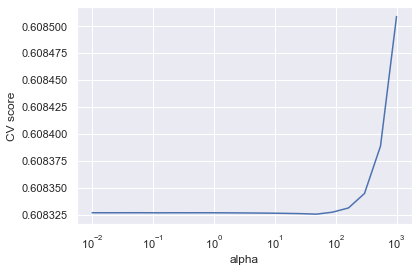

In [193]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_squared_error

alphas = np.logspace(-2, 3, 20)
searcher = GridSearchCV(Ridge(), [{"alpha": alphas}], scoring="neg_root_mean_squared_error", cv = 10)
searcher.fit(column_transformer.transform(X_train3), y_train3)

best_alpha = searcher.best_params_["alpha"]
print("Best alpha = %.4f" % best_alpha)

plt.plot(alphas, -searcher.cv_results_["mean_test_score"])
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("CV score")

In [240]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(best_alpha))
])

model4 = pipeline.fit(X_train3, y_train3)
y_pred4 = model4.predict(X_test3)
print("Test RMSE = %.4f" % mean_squared_error(y_test3, y_pred4, squared=False))

Test RMSE = 0.6093


Best alpha = 0.0100


Text(0, 0.5, 'CV score')

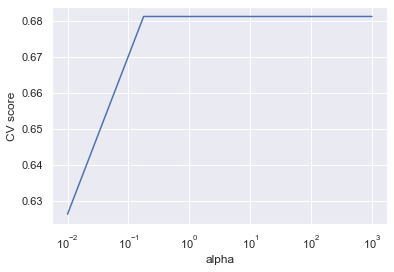

In [208]:
alphas = np.logspace(-2, 3, 5)
searcher = GridSearchCV(lasso_pipeline, [{"regression__alpha": alphas}],
                        scoring="neg_root_mean_squared_error", cv=10)
searcher.fit(X_train3, y_train3)

best_alpha = searcher.best_params_["regression__alpha"]
print("Best alpha = %.4f" % best_alpha)

plt.plot(alphas, -searcher.cv_results_["mean_test_score"])
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("CV score")


In [211]:
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])

pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Lasso(best_alpha))
])

model5 = pipeline.fit(X_train3, y_train3)
y_pred5 = model5.predict(X_test3)
print("Test RMSE = %.4f" % mean_squared_error(y_test3, y_pred5, squared=False))

Test RMSE = 0.6264


Качество лучше для регрессии Ridge для наилучших альф

Для каждого перебранного `alpha` для Lasso посчитайте количество нулевых весов в модели и нарисуйте график зависимости его от `alpha`. Как сильно придётся потерять в качестве, если мы хотим с помощью Lasso избавиться хотя бы от половины признаков?

In [219]:
alphas = np.logspace(-4, 2, 5)
searcher = GridSearchCV(lasso_pipeline, [{"regression__alpha": alphas}],
                        scoring="neg_root_mean_squared_error", cv=10)
searcher.fit(X_train3, y_train3)

best_alpha = searcher.best_params_["regression__alpha"]
print("Best alpha = %.4f" % best_alpha)

plt.plot(alphas, np.sum(pipeline.steps[-1][-1].coef_ == 0))
plt.xscale("log")
plt.xlabel("alpha")
plt.ylabel("CV score")
# долго работает

KeyboardInterrupt: 

<img src="https://www.dropbox.com/s/wp4jj0599np17lh/map_direction.png?raw=1" width="20%" align="right" style="margin-left: 20px">

**Задание 15 (1 балл)**. Часто бывает полезным использовать взаимодействия признаков (feature interactions), то есть строить новые признаки на основе уже существующих. Выше мы разбили карту Манхэттена на ячейки и придумали признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка".

Давайте попробуем сделать следующее: посчитаем, сколько раз встречается каждая возможная пара этих признаков в нашем датасете и выберем 100 самых частых пар. Закодируем поездки с этими частыми парами как категориальный признак, остальным объектам припишем -1. Получается, что мы закодировали, откуда и куда должно было ехать такси.

Также можете придумать ещё какой-нибудь способ сделать признаки про маршрут. Если эти признаки будут давать хороший прирост в качестве, то за это могут быть даны дополнительные бонусные баллы.

**Вопрос**: Почему такой признак потенциально полезный? Почему линейная модель не может самостоятельно "вытащить" эту информацию, ведь у нее в распоряжении есть признаки "из какой ячейки началась поездка" и "в какой ячейке закончилась поездка"?

Модель сама не вытаскивает информацию, так как она обучается на данных, которые мы передаем ей. 
Данный признак потенциально полезный так как он захватывает паттерны начала и конца поездки. Возможно большое количество поездок совершается через определенных квадратики, и поэтому можно будет прогнозировать для какого-то квадратика, куда человек отправится. 

In [229]:
def vector(feat1, feat2):
    return str(feat1)+str(feat2)

ans = X_train3.groupby(['new_feature','new_feature_finish']).count()[['id']].sort_values(by = "id", ascending =False)[:100].reset_index()
vectors = np.vectorize(vector)
connection = vectors(ans['new_feature'].values, ans['new_feature_finish'].values)
df3 = pd.DataFrame(vectors(X_train3['new_feature'].values, X_train3['new_feature_finish'].values))

In [233]:
res = np.where(df3.isin(connection), df3, str(-1)).flatten()
X_train3['connection'] = res
res

array(['1515', '04', '105', ..., '-15', '1115', '1511'], dtype=object)

In [248]:
# аналогично группировка с тестовой выборкой
ans1 = X_test3.groupby(['new_feature','new_feature_finish']).count()[['id']].sort_values(by = "id", ascending =False)[:100].reset_index()
connection1 = vectors(ans1['new_feature'].values, ans1['new_feature_finish'].values)
df4 = pd.DataFrame(vectors(X_test3['new_feature'].values, X_test3['new_feature_finish'].values))
res1 = np.where(df4.isin(connection), df4, str(-1)).flatten()
X_test3['connection'] = res1

//anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  """


Заново обучите модель (`Ridge`, если она дала более высокое качество в предыдущих экспериментах, и `Lasso` иначе) на новых даннных и посчитайте качество на тестовой выборке

In [249]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ
#Ridge дала большее качество, поэтому обучаю потом по ней
categorical = ['hour', 'day_year', 'month', 'pickup_day', 'new_feature', 'new_feature_finish', 'connection']
numeric_features = ['anom_23', 'anom_24', 'jam', 'no_jam', 'kennedy_finish', 'kennedy_start','la_guardia_finish', 'la_guardia_start']
column_transformer = ColumnTransformer([
    ('ohe', OneHotEncoder(handle_unknown="ignore"), categorical),
    ('scaling', StandardScaler(), numeric_features)
])
pipeline = Pipeline(steps=[
    ('ohe_and_scaling', column_transformer),
    ('regression', Ridge(best_alpha))
])

model6 = pipeline.fit(X_train3, y_train3)
y_pred6 = model6.predict(X_test3)
print("Test RMSE = %.4f" % mean_squared_error(y_test3, y_pred6, squared=False))

Test RMSE = 0.4818


Как видно ввод данных признаков существенно улучшил модель.

In [ ]:
Максимальная оценка 9.5 - трансформер кажется не доконца красиво оформлен

**Задание 16 (бонус, 1 балл)**. Где, как не для нашей задачи, считать манхэттенское расстояние?

**Вопрос**: Найдите, что такое манхэттенское расстояние и почему оно так называется. Как оно нам может помочь?

Введите систему координат на нашей карте так, чтобы оси были параллельны улицам Манхэттена, и добавьте сначала в данные признак "манхэттенское расстояние между пунктом отправления и пунктом назначения", а затем и логарифм этого признака. Посчитайте корреляцию между вашим новыми признаком и таргетом; между `log_haversine` и таргетом. В каком случае корреляция больше?

Нарисуйте карту, где покажете выбранные оси. Чтобы мы могли проверить вашу работу, просьба сделать скрин этой карты и приложить картинку (если мы откроем ваш ноутбук, виджеты отображаться не будут). 

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Заново обучите модель на новых даннных и посчитайте качество на тестовой выборке. Стало ли лучше? Объясните полученный результат.

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

**Задание 17 (бонус, 2 балла)**. Реализуйте трансформер, который строит разбиение карты по шестигранной решётке с помощью библиотеки [H3](https://github.com/uber/h3-py) и вычисляет признаки на основе такого разбиения.

Признаки могут быть самые разные: расстояние между точкой старта и финиша, посчитанное в количестве шестиугольников; статистика по числу поездок и по их продолжительности в соседних шестиугольниках.

Важно: производительность библиотеки существенно зависит от количества шестиугольников на карте (определяется параметром resolution). Подберите такое разрешение, при котором ваш код будет работать за приемлемое время.

При построении признаков старайтесь не допустить утечки целевой переменной (подробнее про это можно почитать в материалах 1-го семинара) — в противном случае хорошего качества на тестовой выборке достичь не получится.

Измерьте качество после добавления новых признаков. За улучшение функционала ошибки на каждые 0.005 на тестовой выборке будет даваться 0.5 бонусных балла. Можно получить до 2 бонусных баллов за это задание.

In [ ]:
#╰( ͡° ͜ʖ ͡° )つ──☆*:・ﾟ

Вставьте картинку, описывающую ваш опыт выполнения этого ДЗ.